# Advanced Lane Finding Project

The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
9. Video pipeline

In [1]:
import os
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import pickle
%matplotlib inline

## Step 1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [2]:
# Display `images` on a [`cols`, `rows`] subplot grid.
# images is a list of map [{image_file_name : image}]
def show_images(images, cols = 4, rows = 5, figsize=(15,10), cmap = None): 
    imgLength = len(images)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    
    indexes = range(cols * rows)
    for ax, index in zip(axes.flat, indexes):
        if index < imgLength:
            imagePathName, image = images[index]
            if cmap == None:
                ax.imshow(image)
            else:
                ax.imshow(image, cmap=cmap)
            ax.set_title(imagePathName)
            ax.axis('off')
        

In [3]:
out_dir = 'output_images/'

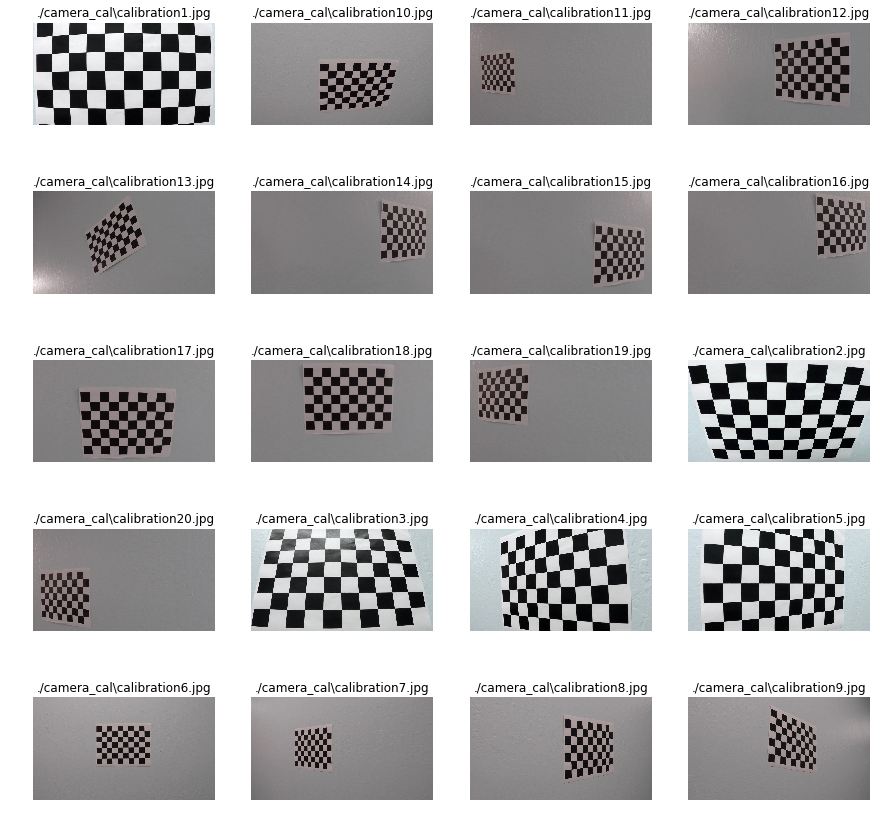

In [4]:
# Load calibration images.
calibration_images = list(map(lambda image_file_name: (image_file_name, cv2.imread(image_file_name)), glob.glob('./camera_cal/c*.jpg')))
show_images(calibration_images, 4, 5, (15, 15))

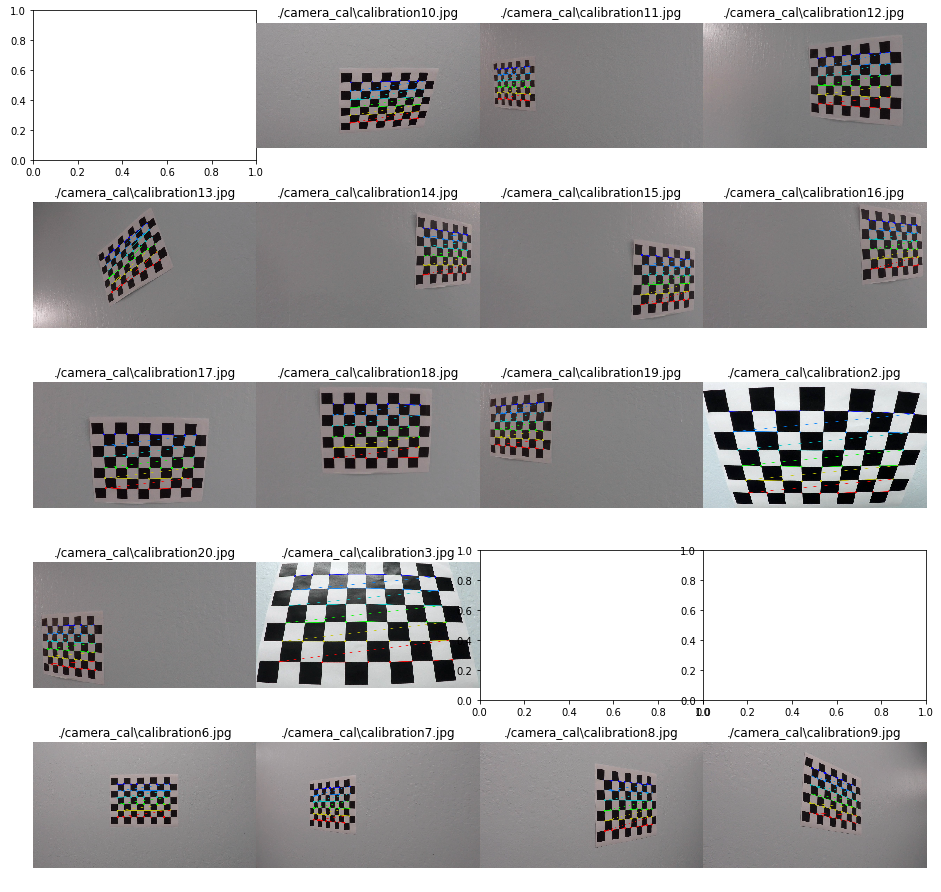

In [5]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

fig, axs = plt.subplots(5,4, figsize=(16, 16))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)

        # this step to refine image points was taken from:
        # http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_calibration/py_calibration.html
        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)
    
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        axs[i].axis('off')
        axs[i].imshow(img)
        axs[i].set_title(fname)
        
        image_name=os.path.split(fname)[1]
        write_name = out_dir+'calibration/'+'corners'+image_name
        cv2.imwrite(write_name, img)


*Note: Some of the chessboard images don't appear because `findChessboardCorners` was unable to detect the desired number of internal corners.*


In [6]:
# Test undistortion on an image
img = cv2.imread('./camera_cal/calibration3.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
dst = cv2.undistort(img, mtx, dist, None, mtx)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
pickle.dump( { 'mtx': mtx, 'dist': dist }, open( './data/camera_calibration.p', 'wb' ) )


True

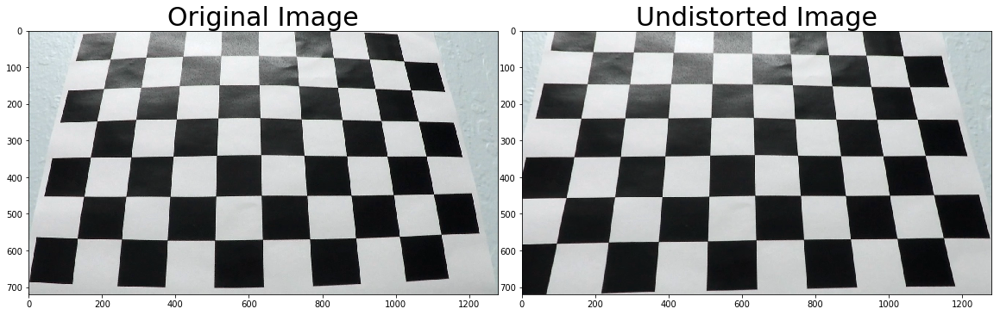

In [7]:
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

write_name = out_dir+'calibration/calibration3'
cv2.imwrite(write_name+'orig.jpg', img)
cv2.imwrite(write_name+'undist.jpg', dst)



In [8]:
# Loading camera calibration
cameraCalibration = pickle.load( open('./data/camera_calibration.p', 'rb' ) )
mtx, dist = map(cameraCalibration.get, ('mtx', 'dist'))

## Step 2. Apply a distortion correction to raw images.

In [9]:
# Load test images.
test_images = list(map(lambda image_file_name: (image_file_name, cv2.imread(image_file_name)), 
                      glob.glob('./test_images/*.jpg')))


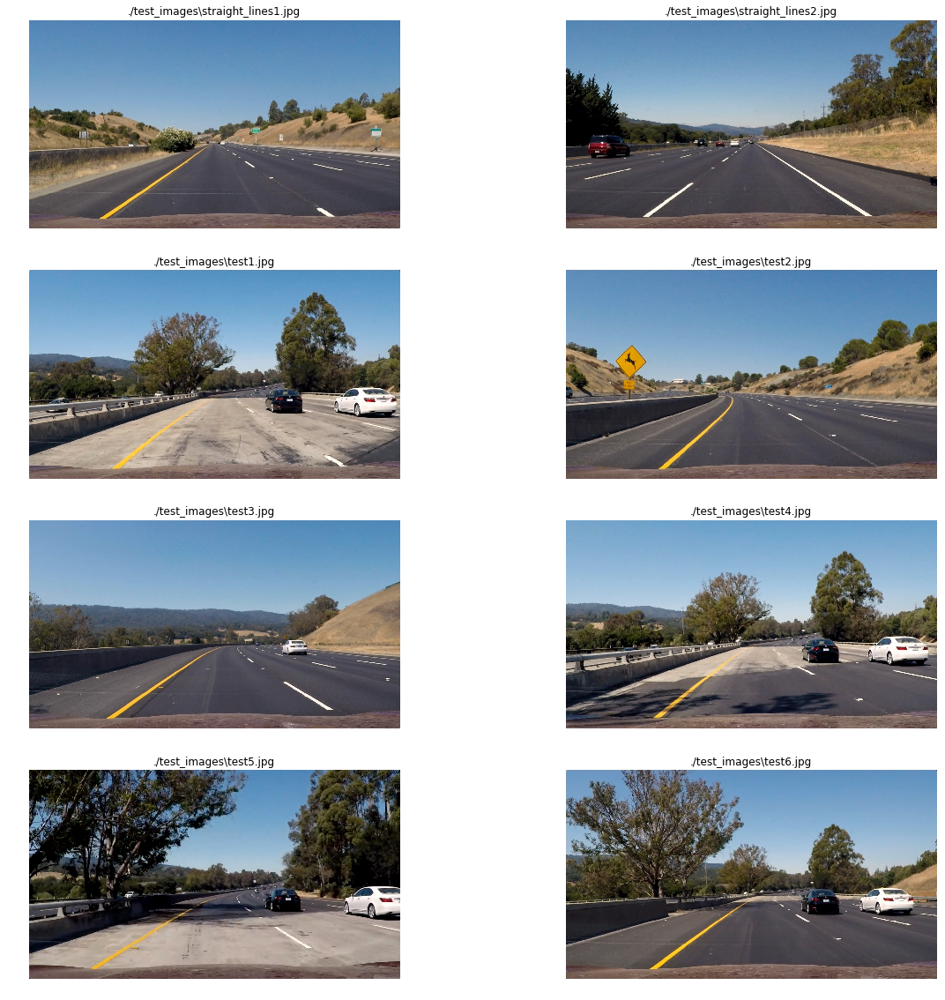

In [10]:
color_images = list(map(lambda img: (img[0], cv2.cvtColor(img[1], cv2.COLOR_BGR2RGB)),test_images))
show_images(color_images, 2, 4, (20, 20))

In [11]:
sample_test_image = cv2.imread('./test_images/test3.jpg')
sample_test_image = cv2.cvtColor(sample_test_image, cv2.COLOR_BGR2RGB)

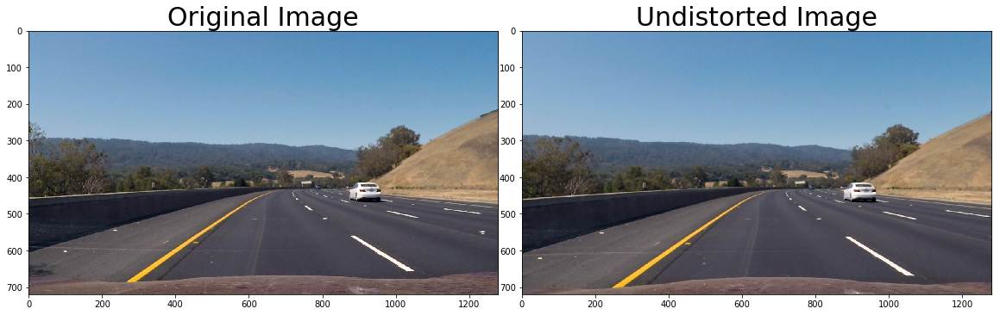

In [12]:
sample_test_image_undistort =  cv2.undistort(sample_test_image, mtx, dist, None, mtx)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(sample_test_image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(sample_test_image_undistort)
ax2.set_title('Undistorted Image', fontsize=30)


## Step 3.	Use color transforms, gradients, etc., to create a thresholded binary image.


In [13]:
#Undistort the image with `mtx`, `dist`
def undistort(image):
    return  cv2.undistort(image, mtx, dist, None, mtx)

In [14]:
#convert undistorted image to HLS
def apply_HLS(undist, mtx=mtx, dist=dist):
    return cv2.cvtColor(undist, cv2.COLOR_BGR2HLS)

In [15]:
index = 4
original = test_images[index][1]
hlsOriginal = apply_HLS(undistort(original))

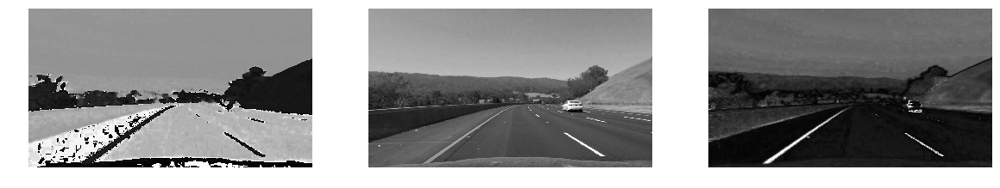

In [16]:
# explore the color space
fig, axes = plt.subplots(ncols=3, figsize=(20,10))
for index, a in enumerate(axes):
    a.imshow(hlsOriginal[:,:,index], cmap='gray')
    a.axis('off')
    
    write_name = out_dir+'transform/original'
    if index == 0:
        color_trans = 'H'
    elif index == 1:
        color_trans = 'L'
    elif index == 2:
        color_trans = 'S'
    else:
        color_trans = 'Unknown'
    cv2.imwrite(write_name+ color_trans +'.jpg', hlsOriginal[:,:,index])
    
    

In [17]:
#img must be undistorted image
def absSobelThresh(img, orient='x', sobel_kernel=3, thresh_min=0, thresh_max=255):
    """
    Calculate the Sobel gradient on the direction `orient` and return a binary thresholded image 
    on [`thresh_min`, `thresh_max`]. Using `sobel_kernel` as Sobel kernel size.
    """
    if orient == 'x':
        yorder = 0
        xorder = 1
    else:
        yorder = 1
        xorder = 0
        
    sobel = cv2.Sobel(img, cv2.CV_64F, xorder, yorder, ksize=sobel_kernel)
    abs_sobel = np.absolute(sobel)
    scaled = np.uint8(255.0*abs_sobel/np.max(abs_sobel))
  
    """
    Applies a threshold to the `img` using [`thresh_min`, `thresh_max`] returning a binary image [0, 255]
    """
    xbinary = np.zeros_like(scaled)
    xbinary[(scaled >= thresh_min) & (scaled <= thresh_max)] = 1
    return xbinary



In [18]:
s_channel = lambda img: apply_HLS(img)[:,:,2]

In [19]:
sobelX = lambda img: absSobelThresh(s_channel(img), thresh_min=10, thresh_max=160)
sobelY = lambda img: absSobelThresh(s_channel(img), orient='y', thresh_min=10, thresh_max=160)

In [20]:
# The following is a test to get rid of shallow problem in the video

def select_yellow(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    lower = np.array([20,60,60])
    upper = np.array([38,174, 250])
    mask = cv2.inRange(hsv, lower, upper)
    return mask

def select_white(image):
    lower = np.array([202,202,202])
    upper = np.array([255,255,255])
    mask = cv2.inRange(image, lower, upper)
    return mask

def color_comb_thresh(image):
    yellow = select_yellow(image)
    white = select_white(image)
    combined_binary = np.zeros_like(yellow)
    combined_binary[(yellow >= 1) | (white >= 1)] = 1
    return combined_binary


### Combining Gradients

In [21]:
#img must be undistorted image
def combine_gradients(img):
    """
    Compute the combination of Sobel X and Sobel Y or Magnitude and Direction
    """
    sobel_x = sobelX(img)
    sobel_y = sobelY(img)
    yellow_white = color_comb_thresh(img)
    combined = np.zeros_like(sobel_x) 
    combined[(((sobel_x == 1) & (sobel_y == 1) ) | yellow_white == 1)] = 1
    return combined

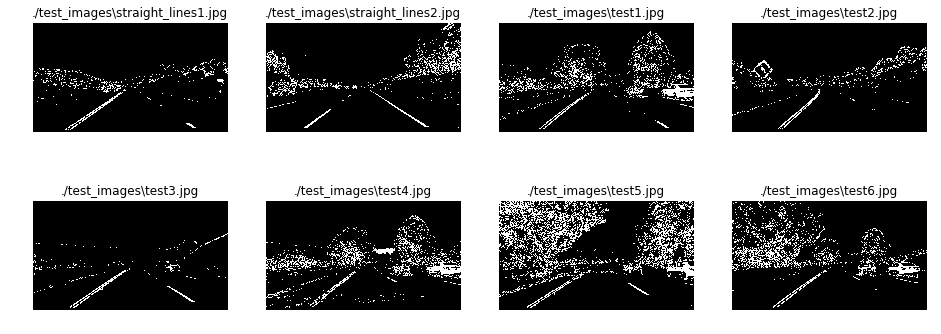

In [22]:
undist_test_images = list(map(lambda img: (img[0], undistort(img[1])), test_images))
combined_images = list(map(lambda img: (img[0], combine_gradients(img[1])), undist_test_images))
show_images( combined_images, 4, 2, (16, 6), cmap='gray')

## Step 4.	Apply a perspective transform to rectify binary image ("birds-eye view").

True

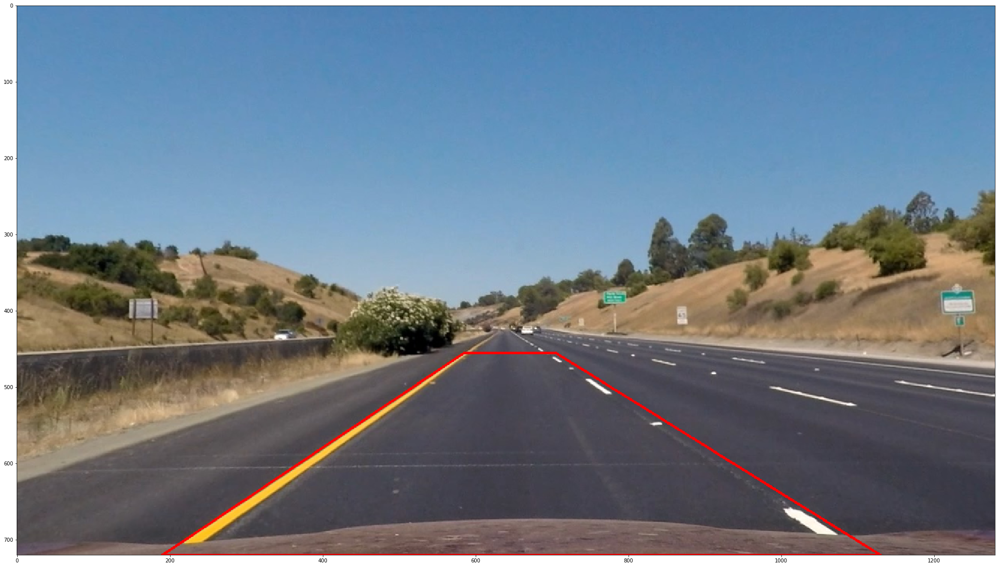

In [23]:
index = 0
original = cv2.cvtColor(test_images[index][1],cv2.COLOR_BGR2RGB)
undist = cv2.cvtColor(undist_test_images[index][1],cv2.COLOR_BGR2RGB)

xSize, ySize, _ = undist.shape
copy = undist.copy()

bottomY = 720
topY = 455


left1 = (190, bottomY)
left1_x, left1_y = left1
left2 = (585, topY)
left2_x, left2_y = left2

right1 = (705, topY)
right1_x, right1_y = right1

right2 = (1130, bottomY)
right2_x, right2_y = right2

color = [255, 0, 0]
w = 2
cv2.line(copy, left1, left2, color, w)
cv2.line(copy, left2, right1, color, w)
cv2.line(copy, right1, right2, color, w)
cv2.line(copy, right2, left1, color, w)
fig, ax = plt.subplots(figsize=(40, 20))
ax.imshow(copy)


write_name = out_dir+'transform/'
cv2.imwrite(write_name+'perSource.jpg', cv2.cvtColor(copy,cv2.COLOR_RGB2BGR ))



source:
[[  585.   455.]
 [  705.   455.]
 [ 1130.   720.]
 [  190.   720.]]
destination:
[[  200.     0.]
 [ 1080.     0.]
 [ 1080.   720.]
 [  200.   720.]]


True

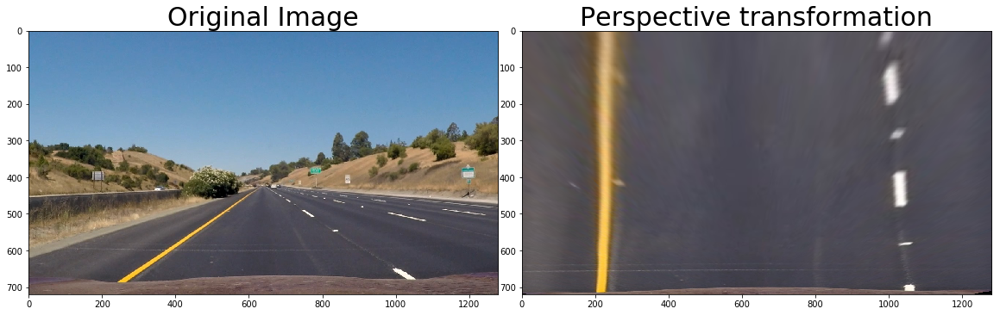

In [24]:
gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
src = np.float32([ 
    [left2_x, left2_y],
    [right1_x, right1_y],
    [right2_x, right2_y],
    [left1_x, left1_y]
])
nX = gray.shape[1]
nY = gray.shape[0]
img_size = (nX, nY)
offset = 200
dst = np.float32([
    [offset, 0],
    [img_size[0]-offset, 0],
    [img_size[0]-offset, img_size[1]], 
    [offset, img_size[1]]
])

print("source:")
print(src)
print("destination:")
print(dst)

img_size = (gray.shape[1], gray.shape[0])

h,w = undist.shape[:2]
# use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)
# use cv2.warpPerspective() to warp your image to a top-down view
warped = cv2.warpPerspective(undist, M, (w,h), flags=cv2.INTER_LINEAR)

# Visualize warped
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(original)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(warped)
ax2.set_title('Perspective transformation', fontsize=30)


write_name = out_dir+'transform/'
cv2.imwrite(write_name+'perOrigin.jpg', cv2.cvtColor(original,cv2.COLOR_RGB2BGR ))
cv2.imwrite(write_name+'perDestination.jpg', cv2.cvtColor(warped,cv2.COLOR_RGB2BGR ))




In [25]:
pickle.dump( { 'M': M, 'Minv': Minv }, open('./data/perspective_transform.p', 'wb'))
print(M)
print(Minv)

[[ -6.83269851e-01  -1.49897451e+00   1.06311163e+03]
 [ -4.99600361e-15  -1.98300615e+00   9.02267800e+02]
 [ -6.93889390e-18  -2.40257838e-03   1.00000000e+00]]
[[  1.36363636e-01  -7.78812057e-01   5.57727273e+02]
 [ -4.44089210e-16  -5.04284870e-01   4.55000000e+02]
 [ -2.16840434e-18  -1.21158392e-03   1.00000000e+00]]


In [26]:
transMatrix = pickle.load( open('./data/perspective_transform.p', 'rb' ) )
M, Minv = map(transMatrix.get, ('M', 'Minv'))

In [27]:
def apply_perspective(image, M=M):
    #Apply the transformation matrix `M` on the image
    img_size = (image.shape[1], image.shape[0])
    warped = cv2.warpPerspective(image, M, img_size)
    return warped

combine_and_warp = lambda img: apply_perspective(combine_gradients(img))

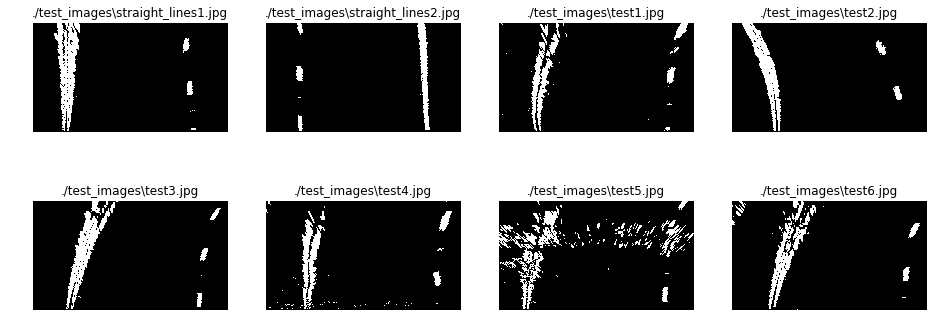

In [28]:
binary_warped = list(map(lambda img: (img[0], combine_and_warp(img[1])), undist_test_images))
show_images(binary_warped, 4, 2, (16, 6), cmap='gray')


## Step 5.	Detect lane pixels and fit to find the lane boundary.

First take a histogram along all the columns in the lower half of the image (use test image 0)

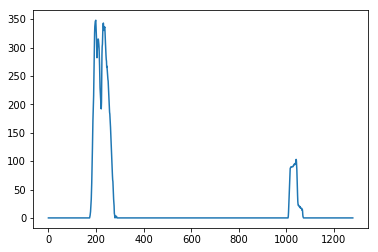

In [29]:
img = binary_warped[0][1]
histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
plt.plot(histogram)

In [30]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
#xm_per_pix = 3.7/700 # meters per pixel in x dimension

xm_per_pix = 3.7/900 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters. From above, it's 1100-200 = 900 pixel

def find_lines(image, nwindows=9, margin=110, minpix=50):
    """
    Find the polynomial representation of the lines in the `image` using:
    - `nwindows` as the number of windows.
    - `margin` as the windows margin.
    - `minpix` as minimum number of pixes found to recenter the window.
    - `ym_per_pix` meters per pixel on Y.
    - `xm_per_pix` meters per pixels on X.
    
    Returns (left_fit, right_fit, left_lane_inds, right_lane_inds, out_img, nonzerox, nonzeroy)
    """    
    # Make a binary and transform image
    binary_warped = combine_and_warp(image)
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Fit a second order polynomial to each
    left_fit_m = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_m = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    return (left_fit, right_fit, left_fit_m, right_fit_m, left_lane_inds, right_lane_inds, out_img, nonzerox, nonzeroy)


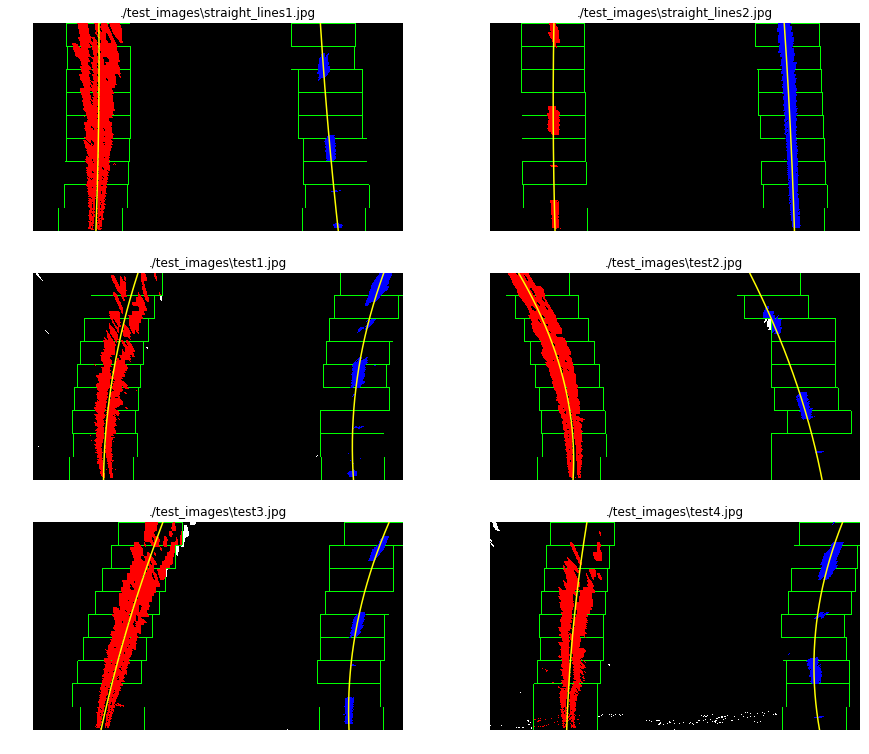

In [31]:
cols = 2 
rows = 3
figsize=(15, 13)
imgLength = len(undist_test_images)
fig, axes = plt.subplots(rows, cols, figsize=figsize)
indexes = range(cols * rows)
imagesPoly = []
for ax, index in zip(axes.flat, indexes):
    if index < imgLength:
        imagePathName, image = undist_test_images[index]
        
        left_fit, right_fit, left_fit_m, right_fit_m, left_lane_inds, right_lane_inds, out_img, nonzerox, nonzeroy = find_lines(image)
        # Visualization
        ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        ax.imshow(out_img)
        ax.plot(left_fitx, ploty, color='yellow')
        ax.plot(right_fitx, ploty, color='yellow')
        
        
        ax.set_title(imagePathName)
        ax.axis('off')
        imagesPoly.append( ( imagePathName, left_fit, right_fit, left_fit_m, right_fit_m ) )


## 6.	Determine the curvature of the lane and vehicle position with respect to center.

In [32]:
#Returns the curvature of the polynomial `fit` on the y range `yRange`.
def calculate_curvature_left(yRange, left_fit_cr):
    return ((1 + (2*left_fit_cr[0]*yRange*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])

def calculate_curvature_right(yRange, right_fit_cr):

    return ((1 + (2 * right_fit_cr[0] * yRange * ym_per_pix + right_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
        2 * right_fit_cr[0])

for imagePoly in imagesPoly:
    imagePath, left_fit, right_fit, left_fit_m, right_fit_m = imagePoly
    yRange = 719
    leftCurvature = calculate_curvature_left(yRange, left_fit_m) / 1000
    rightCurvature = calculate_curvature_right(yRange, right_fit_m) / 1000
    print('Image : {}, Left : {:.2f} km, Right : {:.2f} km'.format(imagePath, leftCurvature, rightCurvature))
    

Image : ./test_images\straight_lines1.jpg, Left : 6.82 km, Right : 6.43 km
Image : ./test_images\straight_lines2.jpg, Left : 6.36 km, Right : 8.43 km
Image : ./test_images\test1.jpg, Left : 0.97 km, Right : 0.70 km
Image : ./test_images\test2.jpg, Left : 0.47 km, Right : 0.96 km
Image : ./test_images\test3.jpg, Left : 1.89 km, Right : 0.64 km
Image : ./test_images\test4.jpg, Left : 2.33 km, Right : 0.53 km


## 7.	Warp the detected lane boundaries back onto the original image.

In [33]:
#Draw the lane lines on the image `img` using the poly `left_fit` and `right_fit`.
def drawLine(img, left_fit, right_fit):
    yMax = img.shape[0]
    ploty = np.linspace(0, yMax - 1, yMax)
    color_warp = np.zeros_like(img).astype(np.uint8)
    
    # Calculate points.
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    return cv2.addWeighted(img, 1, newwarp, 0.3, 0)

#Find and draw the lane lines on the image `img`
def drawLaneOnImage(img):
    left_fit, right_fit, left_fit_m, right_fit_m, _, _, _, _, _ = find_lines(img)
    output = drawLine(img, left_fit, right_fit)
    return cv2.cvtColor( output, cv2.COLOR_BGR2RGB )

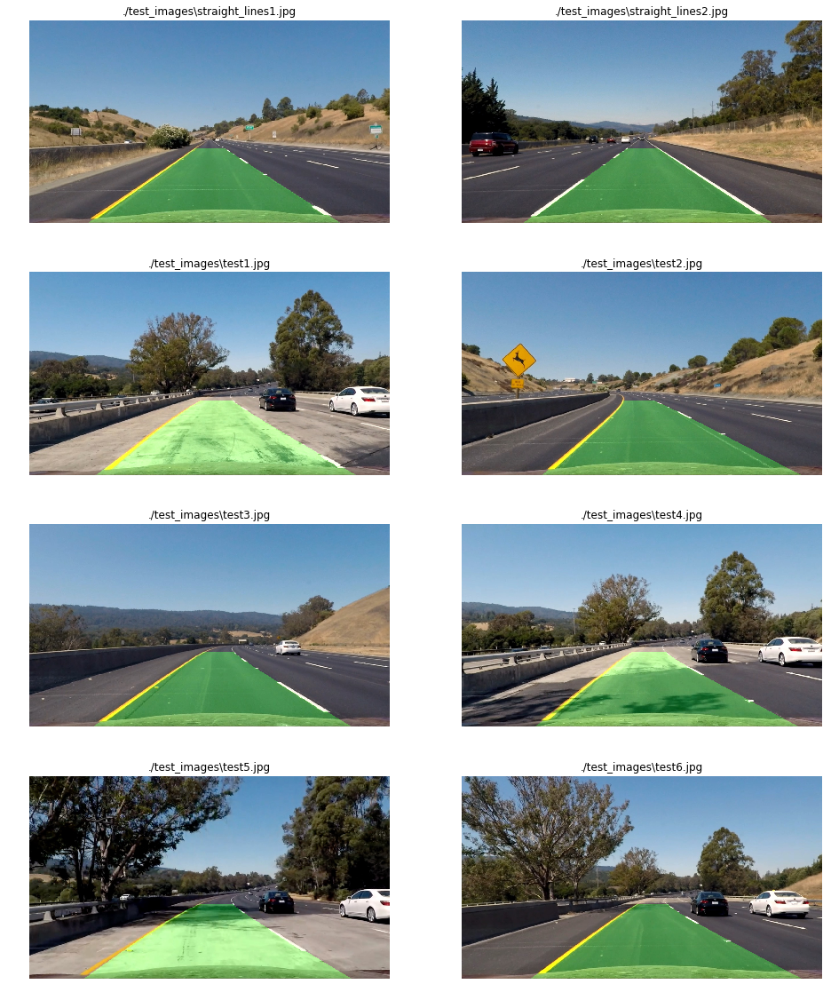

In [34]:
lines_images = list(map(lambda img: (img[0], drawLaneOnImage(img[1])), undist_test_images))
show_images(lines_images, 2, 4, (16, 20))

## 8.	Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [35]:
def pipeline(img, fontScale=2):
    """
    Find and draw the lane lines on the image `img`.
    """
    left_fit, right_fit, left_fit_m, right_fit_m, _, _, _, _, _ = find_lines(img)
    output = drawLine(img, left_fit, right_fit)
    
    # Calculate curvature
    leftCurvature = calculate_curvature_left(yRange, left_fit_m) 
    rightCurvature = calculate_curvature_right(yRange, right_fit_m)
    
    # Calculate vehicle center
    xMax = img.shape[1]*xm_per_pix
    yMax = img.shape[0]*ym_per_pix
    vehicleCenter = xMax / 2
    lineLeft = left_fit_m[0]*yMax**2 + left_fit_m[1]*yMax + left_fit_m[2]
    lineRight = right_fit_m[0]*yMax**2 + right_fit_m[1]*yMax + right_fit_m[2]
    lineMiddle = lineLeft + (lineRight - lineLeft)/2
    diffFromVehicle = lineMiddle - vehicleCenter
    if diffFromVehicle > 0:
        message = '{:.2f} m right'.format(diffFromVehicle)
    else:
        message = '{:.2f} m left'.format(-diffFromVehicle)
    
    # Draw info
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontColor = (255, 255, 255)
    cv2.putText(output, 'Left curvature: {:.0f} m'.format(leftCurvature), (50, 50), font, fontScale, fontColor, 2)
    cv2.putText(output, 'Right curvature: {:.0f} m'.format(rightCurvature), (50, 120), font, fontScale, fontColor, 2)
    cv2.putText(output, 'Vehicle is {} of center'.format(message), (50, 190), font, fontScale, fontColor, 2)
    return cv2.cvtColor(output, cv2.COLOR_BGR2RGB)


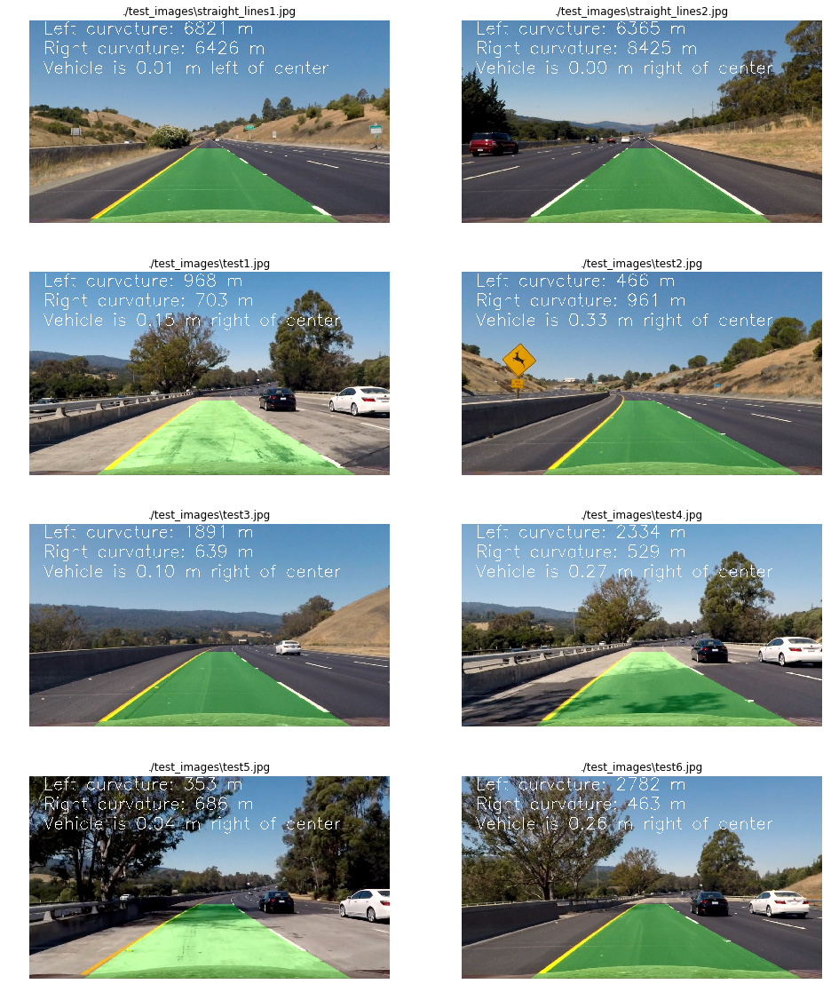

In [36]:
resultDisplay = list(map(lambda img: (img[0], pipeline(img[1])), undist_test_images))
show_images(resultDisplay, 2, 4, (16, 20))


## 9.	Video pipeline

In [37]:
from moviepy.editor import VideoFileClip

class Lane():
    def __init__(self):
        self.left_fit = None
        self.right_fit = None
        self.left_fit_m = None
        self.right_fit_m = None
        self.leftCurvature = None
        self.rightCurvature = None

def calculateLanes(img):
    """
    Calculates the lane on image `img`.
    """
        
    left_fit, right_fit, left_fit_m, right_fit_m, _, _, _, _, _ = find_lines(img)
    # Calculate curvature
    leftCurvature = calculate_curvature_left(yRange, left_fit_m) 
    rightCurvature = calculate_curvature_right(yRange, right_fit_m)
    
    # Calculate vehicle center
    xMax = img.shape[1]*xm_per_pix
    yMax = img.shape[0]*ym_per_pix
    vehicleCenter = xMax / 2
    lineLeft = left_fit_m[0]*yMax**2 + left_fit_m[1]*yMax + left_fit_m[2]
    lineRight = right_fit_m[0]*yMax**2 + right_fit_m[1]*yMax + right_fit_m[2]
    lineMiddle = lineLeft + (lineRight - lineLeft)/2
    diffFromVehicle = lineMiddle - vehicleCenter
    
    return (left_fit, right_fit, left_fit_m, right_fit_m, leftCurvature, rightCurvature, diffFromVehicle)

def displayLanes(img, left_fit, right_fit, left_fit_m, right_fit_m, leftCurvature, rightCurvature, diffFromVehicle):
    """
    Display the lanes information on the image.
    """
     
    output = drawLine(img, left_fit, right_fit)
    
    if diffFromVehicle > 0:
        message = '{:.2f} m right'.format(diffFromVehicle)
    else:
        message = '{:.2f} m left'.format(-diffFromVehicle)
    
    # Draw info
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontColor = (255, 255, 255)
    cv2.putText(output, 'Left curvature: {:.0f} m'.format(leftCurvature), (50, 50), font, 1, fontColor, 2)
    cv2.putText(output, 'Right curvature: {:.0f} m'.format(rightCurvature), (50, 120), font, 1, fontColor, 2)
    cv2.putText(output, 'Vehicle is {} of center'.format(message), (50, 190), font, 1, fontColor, 2)
    return output
    
def videoPipeline(inputVideo, outputVideo):
    """
    Process the `inputVideo` frame by frame to find the lane lines, draw curvarute and vehicle position information and
    generate `outputVideo`
    """
    myclip = VideoFileClip(inputVideo)
    
    leftLane = Lane()
    rightLane = Lane()
    
    def processImage(img_orig):
        img = cv2.undistort(img_orig, mtx, dist, None, mtx)
        left_fit, right_fit, left_fit_m, right_fit_m, leftCurvature, rightCurvature, diffFromVehicle = calculateLanes(img)
        if leftCurvature > 10000:
            left_fit = leftLane.left_fit
            left_fit_m = leftLane.left_fit_m
            leftCurvature = leftLane.leftCurvature
        else:
            leftLane.left_fit = left_fit
            leftLane.left_fit_m = left_fit_m
            leftLane.leftCurvature = leftCurvature
        
        if rightCurvature > 10000:
            right_fit = rightLane.right_fit
            right_fit_m = rightLane.right_fit_m
            rightCurvature = rightLane.rightCurvature
        else:
            rightLane.right_fit = right_fit
            rightLane.right_fit_m = right_fit_m
            rightLane.rightCurvature = rightCurvature
            
        return displayLanes(img, left_fit, right_fit, left_fit_m, right_fit_m, leftCurvature, rightCurvature, diffFromVehicle)

    clip = myclip.fl_image(processImage)
    clip.write_videofile(outputVideo, audio=False)

# Project video
#videoPipeline('project_video.mp4', 'output_videos/project_video.mp4')
#videoPipeline('challenge_video.mp4', 'output_videos/challenge_video.mp4')
videoPipeline('harder_challenge_video.mp4', 'output_videos/harder_challenge_video.mp4')



[MoviePy] >>>> Building video output_videos/harder_challenge_video.mp4
[MoviePy] Writing video output_videos/harder_challenge_video.mp4


100%|███████████████████████████████████████████████████████████████████████████▉| 1199/1200 [03:44<00:00,  5.80it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/harder_challenge_video.mp4 

